In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from unidecode import unidecode
from plotly.graph_objects import Figure, Scatter, Bar
from plotly.subplots import make_subplots
from scipy.spatial.distance import cdist
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler, MinMaxScaler

import requests, json, re, folium
from bs4 import BeautifulSoup
import pandas as pd

import warnings

warnings.filterwarnings('ignore')

In [2]:
df = pd.read_parquet('data/2_preprocessed/preprocessed_sales.parquet')
df.head().T

,0,1,2,3,4
row_id,42433,22253,48883,11731,22255
order_id,AG-2011-2040,IN-2011-47883,HU-2011-1220,IT-2011-3647632,IN-2011-47883
order_date,2011-01-01 00:00:00,2011-01-01 00:00:00,2011-01-01 00:00:00,2011-01-01 00:00:00,2011-01-01 00:00:00
ship_date,2011-06-01 00:00:00,2011-08-01 00:00:00,2011-05-01 00:00:00,2011-05-01 00:00:00,2011-08-01 00:00:00
ship_mode,Standard Class,Standard Class,Second Class,Second Class,Standard Class
customer_id,TB-11280,JH-15985,AT-735,EM-14140,JH-15985
customer_name,Toby Braunhardt,Joseph Holt,Annie Thurman,Eugene Moren,Joseph Holt
segment,Consumer,Consumer,Consumer,Home Office,Consumer
city,Constantine,Wagga Wagga,Budapest,Stockholm,Wagga Wagga
state,Constantine,New South Wales,Budapest,Stockholm,New South Wales


In [3]:
df.country.unique().shape

(147,)

# Human development index

In [4]:
raw_hdi = pd.read_csv('data/1_raw/human-development-index.csv', header=0, encoding='latin_1')
raw_hdi = (raw_hdi[['Entity', 'Year', 'Human Development Index (UNDP)']]
       .rename(columns={'Entity': 'country', 'Year': 'year', 'Human Development Index (UNDP)': 'hdi'})
       .dropna())
raw_hdi = (raw_hdi
       .sort_values('year', ascending=False)
       .drop_duplicates(subset=['country'], keep='first')
       .sort_values('country')
       .drop(columns='year'))
raw_hdi['country'] = (raw_hdi['country']
                  .replace({
                      'Czechia': 'Czech Republic',
                      'Democratic Republic of Congo': 'Democratic Republic of the Congo',
                      'North Macedonia': 'Macedonia',
                      'Myanmar': 'Myanmar (Burma)',
                      'Congo': 'Republic of the Congo',
                      'Eswatini': 'Swaziland'
                  }))
raw_hdi.head()

,country,hdi
17,Afghanistan,0.498
47,Albania,0.785
75,Algeria,0.754
93,Andorra,0.858
112,Angola,0.581


In [5]:
missing_hdi = pd.DataFrame({
    'country': ['Guadeloupe', 'Martinique', 'Somalia', 'Taiwan'],
    'hdi': [0.841, 0.854, 0.351, 0.916]
})

missing_hdi

,country,hdi
0,Guadeloupe,0.841
1,Martinique,0.854
2,Somalia,0.351
3,Taiwan,0.916


In [6]:
hdi = pd.concat([raw_hdi, missing_hdi]).reset_index(drop=True)

In [7]:
set(df['country'].unique()) - set(hdi['country'].unique())

set()

# Population

In [8]:
raw_population = pd.read_csv('data/1_raw/API_SP.POP.TOTL_DS2_en_csv_v2_2445260.csv', header=2)
raw_population = raw_population[['Country Name', '2015']].rename(columns={'Country Name': 'country', '2015': 'population'}).dropna()
raw_population['country'] = raw_population['country'].replace({
    'Congo, Dem. Rep.': 'Democratic Republic of the Congo',
    'Egypt, Arab Rep.': 'Egypt',
    'Hong Kong SAR, China': 'Hong Kong',
    'Iran, Islamic Rep.': 'Iran',
    'Kyrgyz Republic': 'Kyrgyzstan',
    'North Macedonia': 'Macedonia',
    'Myanmar': 'Myanmar (Burma)',
    'Congo, Rep.': 'Republic of the Congo',
    'Russian Federation': 'Russia',
    'Slovak Republic': 'Slovakia',
    'Korea, Rep.': 'South Korea',
    'Eswatini': 'Swaziland',
    'Syrian Arab Republic': 'Syria',
    'Venezuela, RB': 'Venezuela',
    'Yemen, Rep.': 'Yemen'
})

raw_population.head()

,country,population
0,Aruba,104341.0
1,Afghanistan,34413603.0
2,Angola,27884381.0
3,Albania,2880703.0
4,Andorra,78011.0


In [9]:
missing_population = pd.DataFrame({
    'country': ['Guadeloupe', 'Martinique', 'Taiwan', 'Eritrea'],
    'population': [395700, 376480, 23570000, 3214000]
})

missing_population

,country,population
0,Guadeloupe,395700
1,Martinique,376480
2,Taiwan,23570000
3,Eritrea,3214000


In [10]:
population = pd.concat([raw_population, missing_population]).reset_index(drop=True)
population.head()

,country,population
0,Aruba,104341.0
1,Afghanistan,34413603.0
2,Angola,27884381.0
3,Albania,2880703.0
4,Andorra,78011.0


In [11]:
set(df['country']) - set(population['country'])

set()

In [12]:
df = df.merge(hdi, on='country', how='inner', validate='m:1').merge(population, on='country', how='inner', validate='m:1')

# Defining Number of Clusters

In [13]:
numerical_features = ['sales', 'quantity', 'discount', 'shipping_cost', 'hdi', 'population']
target = 'profit'

numerical_columns = numerical_features + [target]

X_train = df[numerical_columns].copy()

scaler = MinMaxScaler()
X_train[numerical_columns] = scaler.fit_transform(df[numerical_columns])

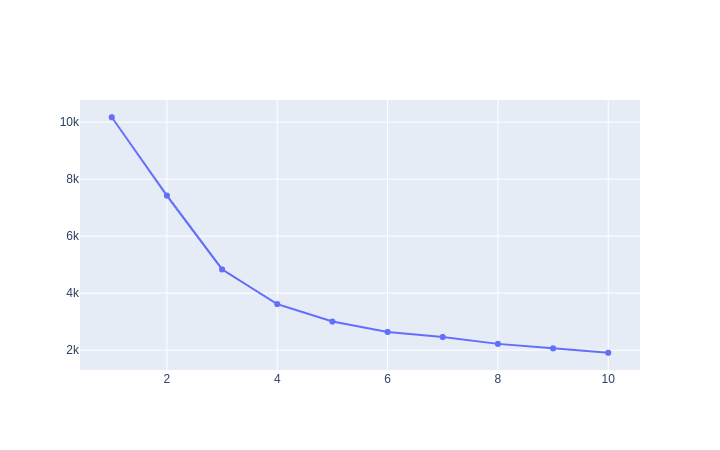

In [14]:
inertias = list()

K = [i for i in range(1, 11)]
for k in K:
    model = KMeans(n_clusters=k).fit(X_train[numerical_features])
    
    inertias.append(model.inertia_)
    
fig = Figure([Scatter(x=K, y=inertias)])
fig.update_layout(title='Inertia by number of Clusters')
fig.show()

In [15]:
n_clusters = 3

# Clustering

In [16]:
seed = 42
k_means = KMeans(n_clusters=n_clusters, init='random', random_state=seed)
k_means.fit(X_train[numerical_features])

KMeans(init='random', n_clusters=3, random_state=42)

In [17]:
X_train.loc[:, 'cluster'] = k_means.predict(X_train[numerical_features])
df.loc[:, 'cluster'] = k_means.predict(X_train[numerical_features])

# Principal Components Analysis

In [18]:
pca = PCA(n_components=2)
pca.fit(X_train[numerical_features])

PCA(n_components=2)

In [19]:
X_train[['pca_0', 'pca_1']] = pca.transform(X_train[numerical_features])

In [20]:
cluster_0 = X_train.query('cluster == 0')
cluster_1 = X_train.query('cluster == 1')
cluster_2 = X_train.query('cluster == 2')

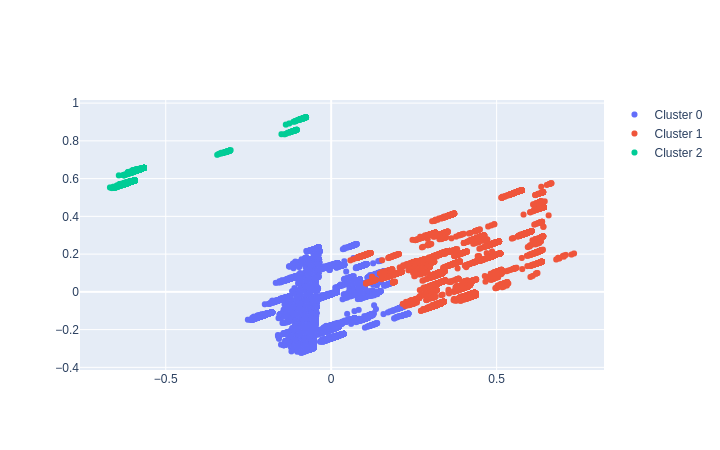

In [21]:
fig = Figure([
    Scatter(x=cluster_0['pca_0'], y=cluster_0['pca_1'], name='Cluster 0', mode='markers'),
    Scatter(x=cluster_1['pca_0'], y=cluster_1['pca_1'], name='Cluster 1', mode='markers'),
    Scatter(x=cluster_2['pca_0'], y=cluster_2['pca_1'], name='Cluster 2', mode='markers'),
])

fig.update_layout(title='Visualização dos Clusters - PCA')

fig.show()

# Analysis

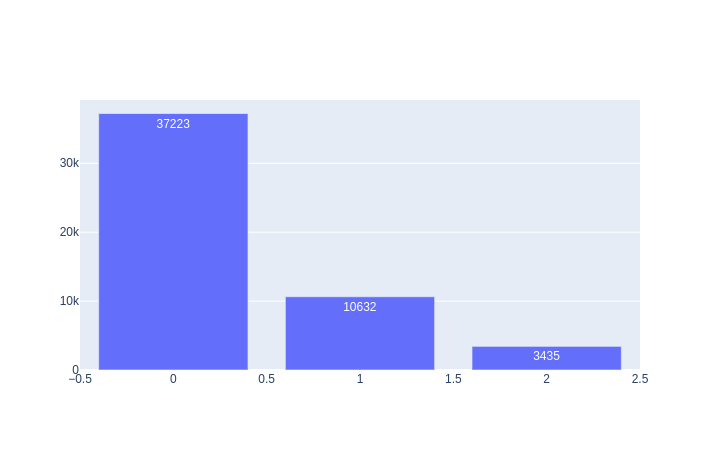

In [22]:
data = X_train['cluster'].value_counts()

fig = Figure([Bar(x=data.index, y=data, text=data, textposition='auto')])
fig.update_layout(title='Quantidade ')
fig.show()

In [23]:
max_value = df['profit'].max()
df['normalized_profit'] = df['profit'] / max_value

agg_df = df[numerical_features + ['cluster', 'profit']].groupby('cluster').agg('mean')
agg_df

,sales,quantity,discount,shipping_cost,hdi,population,profit
cluster,,,,,,,
0,261.882215,3.482685,0.047861,28.033659,0.829606,1.247943e+08,52.997494
1,150.888646,3.370673,0.516724,15.856478,0.774116,1.112185e+08,-73.835907
2,375.607607,3.737700,0.015837,40.971686,0.701298,1.343575e+09,81.442480


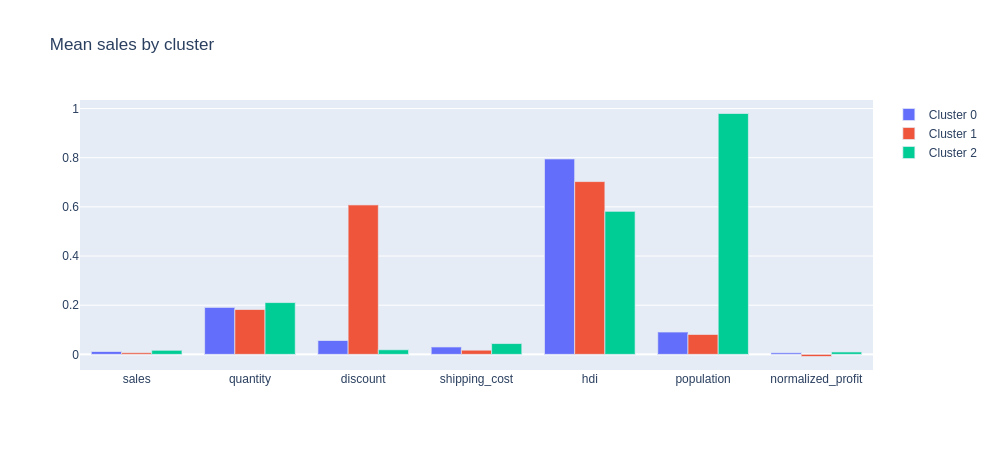

In [24]:
max_value = df['profit'].max()
X_train['normalized_profit'] = df['profit'] / max_value

agg_normalize = X_train[numerical_columns + ['cluster', 'normalized_profit']].groupby('cluster').agg('mean')

fig = Figure([
    Bar(x=numerical_features + ['normalized_profit'], y=agg_normalize.query('cluster == 0')[numerical_features + ['normalized_profit']].iloc[0].values, name='Cluster 0'),
    Bar(x=numerical_features + ['normalized_profit'], y=agg_normalize.query('cluster == 1')[numerical_features + ['normalized_profit']].iloc[0].values, name='Cluster 1'),
    Bar(x=numerical_features + ['normalized_profit'], y=agg_normalize.query('cluster == 2')[numerical_features + ['normalized_profit']].iloc[0].values, name='Cluster 2'),
])

fig.update_layout(title='Mean sales by cluster')

fig.show()

In [32]:
max_value = df['profit'].max()
df['normalized_profit'] = df['profit'] / max_value

agg_df = df[numerical_features + ['cluster', 'profit']].groupby('cluster').agg('median')
agg_df

,sales,quantity,discount,shipping_cost,hdi,population,profit
cluster,,,,,,,
0,94.800,3,0.0,8.600,0.901,6.654827e+07,15.0300
1,49.299,3,0.5,4.485,0.791,7.852941e+07,-19.0586
2,145.890,3,0.0,13.150,0.752,1.371220e+09,27.7500


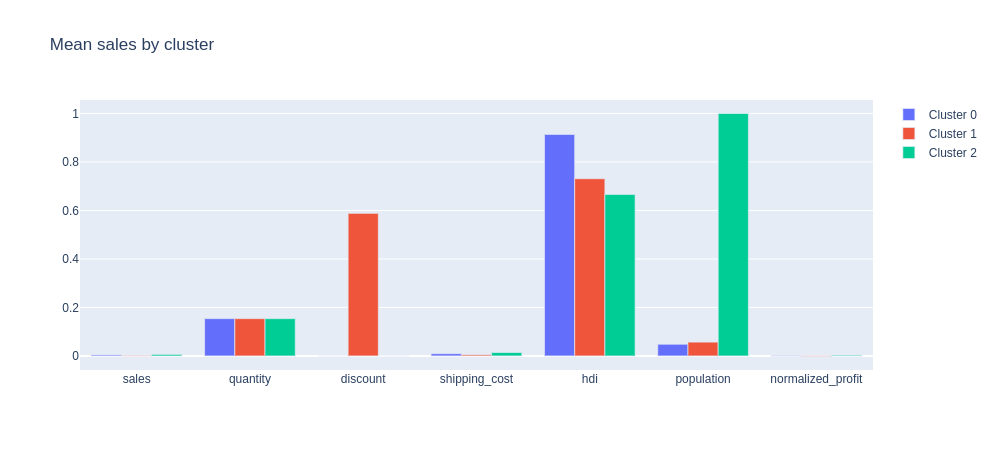

In [34]:
max_value = df['profit'].max()
X_train['normalized_profit'] = df['profit'] / max_value

agg_normalize = X_train[numerical_columns + ['cluster', 'normalized_profit']].groupby('cluster').agg('median')

fig = Figure([
    Bar(x=numerical_features + ['normalized_profit'], y=agg_normalize.query('cluster == 0')[numerical_features + ['normalized_profit']].iloc[0].values, name='Cluster 0'),
    Bar(x=numerical_features + ['normalized_profit'], y=agg_normalize.query('cluster == 1')[numerical_features + ['normalized_profit']].iloc[0].values, name='Cluster 1'),
    Bar(x=numerical_features + ['normalized_profit'], y=agg_normalize.query('cluster == 2')[numerical_features + ['normalized_profit']].iloc[0].values, name='Cluster 2'),
])

fig.update_layout(title='Mean sales by cluster')

fig.show()

# Countries visualization

In [26]:
res = requests.get("https://raw.githubusercontent.com/python-visualization/folium/master/examples/data/world-countries.json")
boundaries = pd.DataFrame(json.loads(res.content.decode()))
boundaries = boundaries.assign(name=boundaries["features"].apply(pd.Series)["properties"].apply(pd.Series)["name"])

df = df.replace({
    'Guinea Bissau': 'Guinea-Bissau',
    'Myanmar': 'Myanmar (Burma)',
    'United States of America': 'United States',
})

boundaries.head()

,type,features,name
0,FeatureCollection,"{'type': 'Feature', 'properties': {'name': 'Af...",Afghanistan
1,FeatureCollection,"{'type': 'Feature', 'properties': {'name': 'An...",Angola
2,FeatureCollection,"{'type': 'Feature', 'properties': {'name': 'Al...",Albania
3,FeatureCollection,"{'type': 'Feature', 'properties': {'name': 'Un...",United Arab Emirates
4,FeatureCollection,"{'type': 'Feature', 'properties': {'name': 'Ar...",Argentina


In [27]:
not_mapped_countries = list(set(df['country'].unique()) - set(boundaries['features'].apply(lambda x: x['properties']['name']).tolist()))

not_mapped_countries_clusters = (
    df
    .loc[df['country'].isin(not_mapped_countries), ['country', 'cluster']]
    .drop_duplicates()
    .sort_values('cluster')
    .astype(str)
    .groupby('country')['cluster']
    .apply(list)
    .apply(lambda x: '_'.join(x))
)

In [28]:
df['country'] = df['country'].replace({
    'Guinea-Bissau': 'Guinea Bissau',
    'Myanmar (Burma)': 'Myanmar',
    'United States': 'United States of America',
})

In [29]:
COLOR_MAP = {
    '0': '#0000FF',
    '1': '#FF0000',
    '2': '#00FF00',
    '0_1': '#FF00FF',
    '0_2': '#00FFFF',
    '1_2': '#FFFF00'
}


def style_fn(feature):
    country_name = feature["properties"]["name"]
    
    if country_name in not_mapped_countries:
        cluster = not_mapped_countries_clusters.loc[country_name]
    else:
        cluster = '_'.join(df.loc[df['country'] == country_name, 'cluster'].sort_values().astype(str).unique().tolist())
    color = COLOR_MAP.get(cluster)
    return {'fillColor':f'{color}', 'color':f'{color}'}

In [30]:
map_instance = folium.Map(location = [1.34, 103.82],
               zoom_start=6,
               control_scale=True)

# overlay desired countries over folium map
for item in boundaries[boundaries['name'].isin(df['country'].unique())].to_dict(orient="records"):
    (
        folium
        .GeoJson(item["features"], name=item["name"], tooltip=item["name"], style_function=style_fn)
        .add_to(map_instance)
    )

map_instance